# Load Libraries

In [59]:
import numpy as np
import matplotlib.pyplot as plt
import os
import re
import requests,io
#import cv2
#import astroalign
import math
from astropy.io import fits
from astropy.stats import sigma_clipped_stats,gaussian_sigma_to_fwhm, SigmaClip
from astropy.table import QTable
from astropy.utils.exceptions import AstropyDeprecationWarning


from photutils.background import LocalBackground, MMMBackground,Background2D,MedianBackground
from photutils.detection import DAOStarFinder
from photutils.psf import PSFPhotometry, IterativePSFPhotometry, IntegratedGaussianPRF,prepare_psf_model, IterativelySubtractedPSFPhotometry, DAOGroup, SourceGrouper

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)


# Load the reduced data

In [60]:
data_path = 'reduced/'

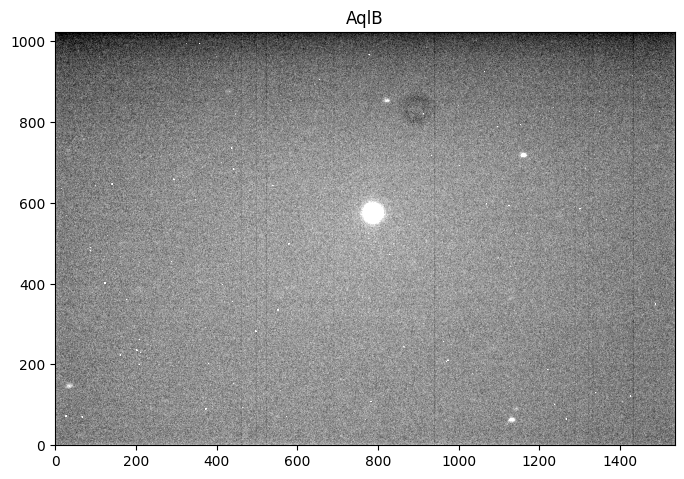

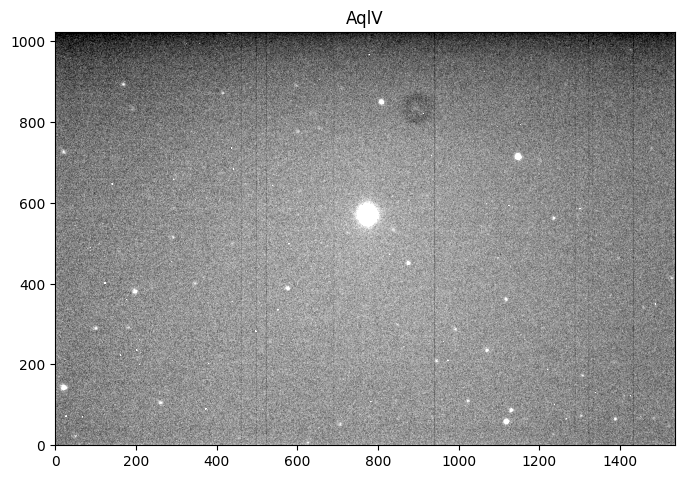

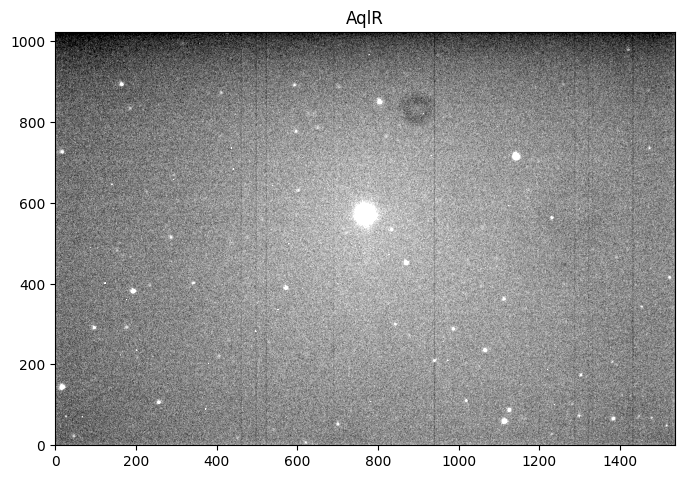

In [61]:
data = {}
data["AqlB"] = np.load(f'{data_path}/AqlB.npy')
data["AqlV"] = np.load(f'{data_path}/AqlG.npy')
data["AqlR"] = np.load(f'{data_path}/AqlR.npy')
#data["AqlV"] =dataAqlV[0]


lo,up= np.percentile(data["AqlB"],1),np.percentile(data["AqlB"],99)
plt.figure(figsize=(8, 8))
plt.imshow(data["AqlB"], cmap='gray', origin='lower', clim=(lo,up))
plt.title(f"AqlB")
plt.show()

lo,up= np.percentile(data["AqlV"],1),np.percentile(data["AqlV"],99)
plt.figure(figsize=(8, 8))
plt.imshow(data["AqlV"], cmap='gray', origin='lower', clim=(lo,up))
plt.title(f"AqlV")
plt.show()

lo,up= np.percentile(data["AqlR"],1),np.percentile(data["AqlR"],99)
plt.figure(figsize=(8, 8))
plt.imshow(data["AqlR"], cmap='gray', origin='lower', clim=(lo,up))
plt.title(f"AqlR")
plt.show()

In [62]:
error = {}
error["AqlB"] = np.load(f'{data_path}/AqlB_error.npy')
error["AqlV"] = np.load(f'{data_path}/AqlG_error.npy')
error["AqlR"] = np.load(f'{data_path}/AqlR_error.npy')

# Background Estimation

In [63]:
for key, image in data.items():
    print(image.shape)

(1024, 1536)
(1024, 1536)
(1024, 1536)


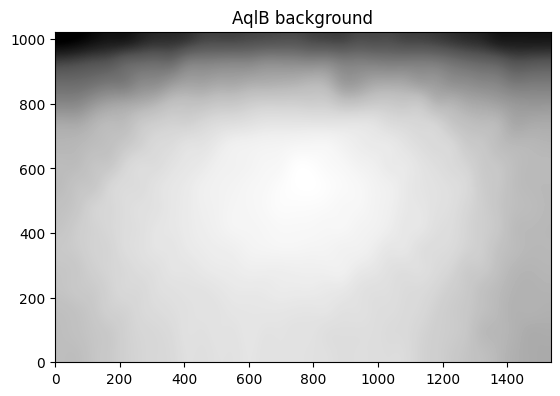

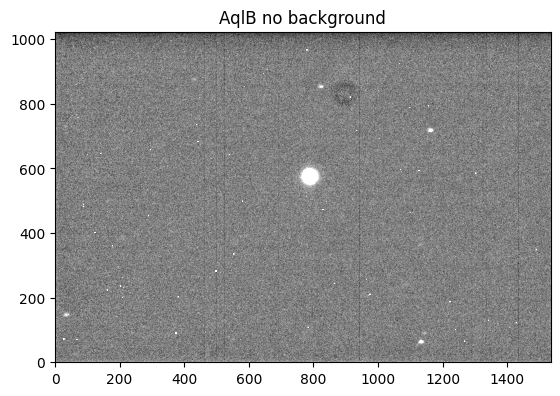

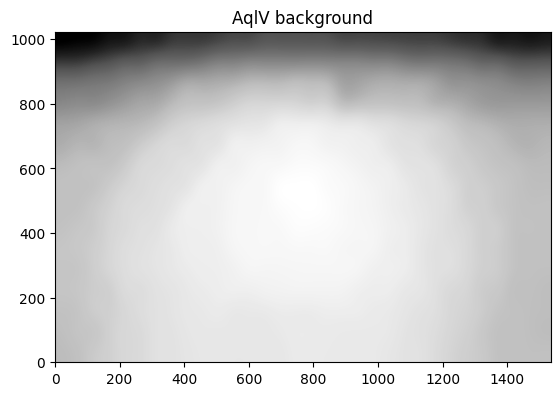

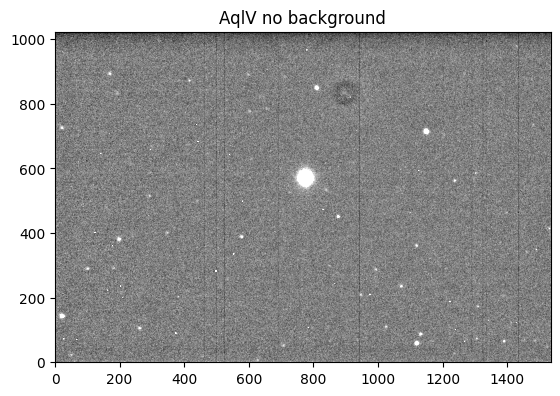

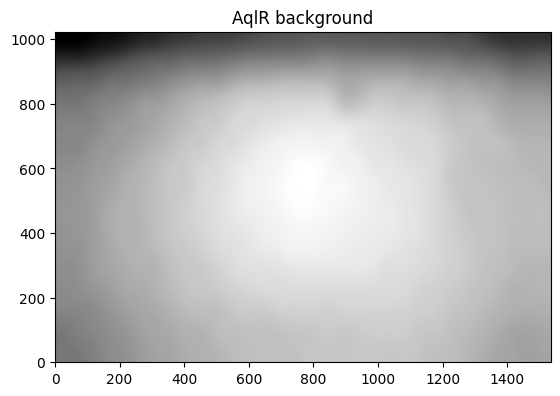

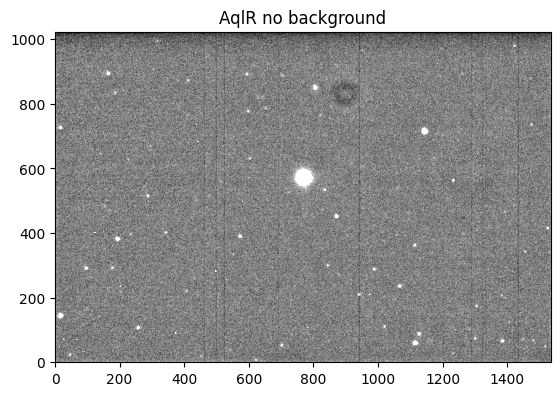

In [64]:
bkgs={}
bkg_uncs = {}
images_nobkg={}
for key, image in data.items():
    sigma_clip = SigmaClip(sigma=3.0)
    bkg_estimator = MedianBackground()
    bkg = Background2D(image,
                       (64,48), #they say it works better if data is covered by int nb of boxes
                       filter_size=(3,3),sigma_clip=sigma_clip,
                    bkg_estimator=bkg_estimator)
    bkgs[key] = bkg.background
    bkg_uncs[key] = bkg.background_rms
    plt.title(f'{key} background')
    plt.imshow(bkg.background, origin='lower', cmap='Greys_r')
    plt.show()

    images_nobkg[key]=image-bkg.background
    lo,up= np.percentile(images_nobkg[key],1),np.percentile(images_nobkg[key],99)
    plt.imshow(images_nobkg[key], cmap='gray', origin='lower', clim=(lo,up))
    plt.title(f'{key} no background')
    plt.show()

    data[key] = image - bkg.background
    

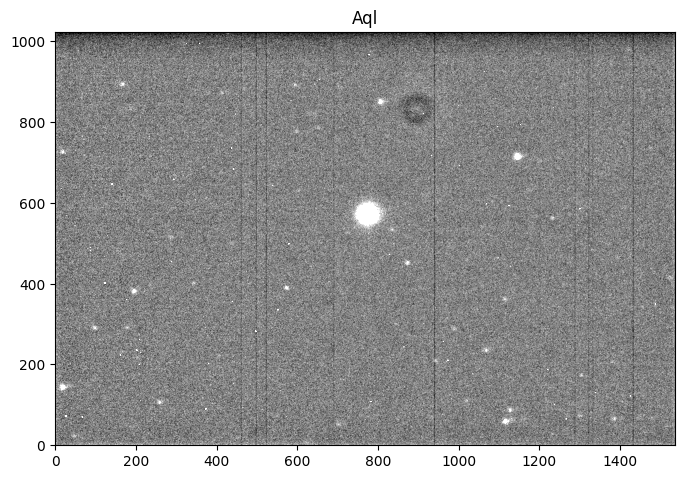

In [65]:
Aql = np.median(np.stack([data["AqlB"], data["AqlV"], data["AqlR"]], axis=0), axis=0)
lo,up= np.percentile(Aql,1),np.percentile(Aql,99)

plt.figure(figsize=(8, 8))
plt.imshow(Aql, cmap='gray', origin='lower', clim=(lo,up))
plt.title(f"Aql")
plt.show()

In [66]:
# Check data types
print("AqlB data type:", data["AqlB"].dtype)
print("AqlV data type:", data["AqlV"].dtype)

# Check image dimensions
print("AqlB shape:", data["AqlB"].shape)
print("AqlV shape:", data["AqlV"].shape)

AqlB data type: float64
AqlV data type: float64
AqlB shape: (1024, 1536)
AqlV shape: (1024, 1536)


# Get 2D FWHM

Found 8 stars in image AqlB


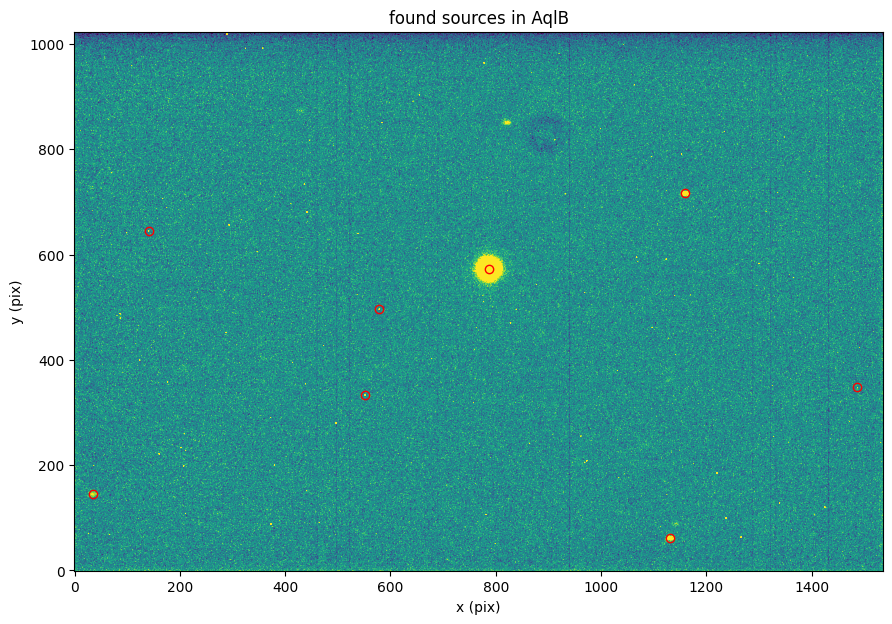

     x-FWHM 8.226842573735528+/-0.0 (pix) for this AqlB 
     y-FWHM 10.225222195092535+/-0.0 (pix) for this AqlB 
     FWHM 9.226032384414031+/-0.0 (pix) for this AqlB 
Found 31 stars in image AqlV


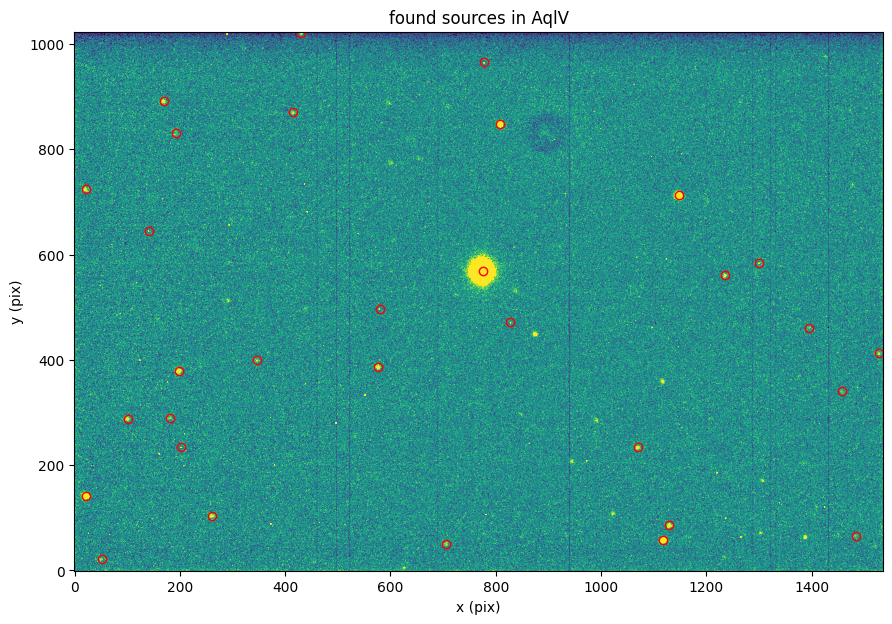

     x-FWHM 6.509831951690535+/-0.0 (pix) for this AqlV 
     y-FWHM 7.281083338236238+/-0.0 (pix) for this AqlV 
     FWHM 6.895457644963386+/-0.0 (pix) for this AqlV 
Found 39 stars in image AqlR


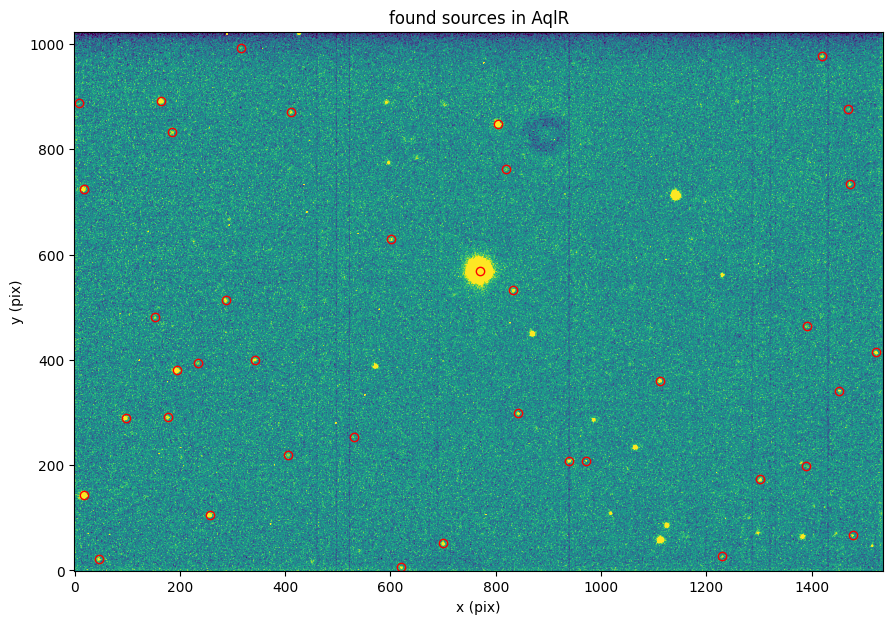

     x-FWHM 6.224776474637745+/-0.0 (pix) for this AqlR 
     y-FWHM 5.954458425263926+/-0.0 (pix) for this AqlR 
     FWHM 6.089617449950836+/-0.0 (pix) for this AqlR 


In [67]:
xfwhms = {}
yfwhms = {}
fwhms = {}
for key, image in data.items():
    mean, median, std = sigma_clipped_stats(image,sigma=3.0,maxiters=5)
    ## Find stars
    daofind = DAOStarFinder(fwhm=15, threshold=6.0*std)  ##peakmax to exclude saturated stars!!
    sources = daofind(image - median)
    print(f"Found {len(sources)} stars in image {key}")

    #Plot stars found
    fig = plt.figure(figsize=(12,7))
    l1 = np.percentile(image[np.isfinite(image)].flatten(), 1)
    l2 = np.percentile(image[np.isfinite(image)].flatten(), 99)
    plt.imshow(image,clim=(l1,l2),origin='lower')
    plt.plot(sources["xcentroid"],sources["ycentroid"],'or',mfc='none')
    plt.title(f"found sources in {key}")
    plt.xlabel("x (pix)")
    plt.ylabel("y (pix)")
    plt.show()

    ## Take nbright brightest stars 
    nbright = 1
    brightest = np.argsort(sources['flux'])[::-1][0:nbright]
    brsources = sources[brightest]

    ##########
    #get fwhm
    rmax = 25
    (ny,nx) = np.shape(image)
    from astropy.modeling import models,fitting
    fit_g = fitting.LevMarLSQFitter()
    allxfwhm, allyfwhm = np.zeros(len(brsources)),np.zeros(len(brsources))
    allfwhm,alltheta = np.zeros(len(brsources)),np.zeros(len(brsources))
    for i,src in enumerate(brsources):
        if int(src['ycentroid']) > rmax and int(src['ycentroid']) < ny-rmax and \
            int(src['xcentroid']) > rmax and int(src['xcentroid']) < nx-rmax:
            img = image[int(src['ycentroid'])-rmax:int(src['ycentroid'])+rmax,
                        int(src['xcentroid'])-rmax:int(src['xcentroid'])+rmax]
            subx,suby = np.indices(img.shape) # instead of meshgrid
            p_init = models.Gaussian2D(amplitude=np.max(img),x_mean=rmax,y_mean=rmax,x_stddev=1.0,y_stddev=1.0)
            fitgauss = fit_g(p_init, subx, suby, img - np.min(img))
            allxfwhm[i] = np.abs(fitgauss.x_stddev.value)
            allyfwhm[i] = np.abs(fitgauss.y_stddev.value)
            allfwhm[i] = 0.5*(allxfwhm[i]+allyfwhm[i])
            alltheta[i] = fitgauss.theta.value
    xfwhm,yfwhm = np.median(allxfwhm)*gaussian_sigma_to_fwhm,np.median(allyfwhm)*gaussian_sigma_to_fwhm
    fwhm = np.median(allfwhm)*gaussian_sigma_to_fwhm
    sigfwhm, sigxfwhm, sigyfwhm = np.std(allfwhm), np.std(allxfwhm), np.std(allyfwhm)
    medtheta = np.median(alltheta)
    print(f"     x-FWHM {xfwhm}+/-{sigxfwhm} (pix) for this {key} ")
    print(f"     y-FWHM {yfwhm}+/-{sigyfwhm} (pix) for this {key} ")
    print(f"     FWHM {fwhm}+/-{sigfwhm} (pix) for this {key} ")

    fwhms[key] = fwhm
    xfwhms[key] = xfwhm
    yfwhms[key] = yfwhm


# 2d gaussians

In [68]:
twodgauss = {}
psf_models = {}
for key, image in data.items():
    twodgauss[key] =  models.Gaussian2D(x_stddev=xfwhms[key]/gaussian_sigma_to_fwhm,
                                        y_stddev=yfwhms[key]/gaussian_sigma_to_fwhm,
                                        )
    
    #twodgauss[key].xname = 'x'
    #twodgauss[key].yname = 'y'
    #twodgauss[key].fluxname = 'amplitude'

    psf_models[key] = prepare_psf_model(twodgauss[key],xname='x_mean',yname='y_mean',fluxname='amplitude')


    

# Find point sources more accuretly with FWHM
more stars found this way:)

In [69]:
fwhms

{'AqlB': 9.226032384414031,
 'AqlV': 6.895457644963386,
 'AqlR': 6.089617449950836}

Found 10 stars in image AqlB


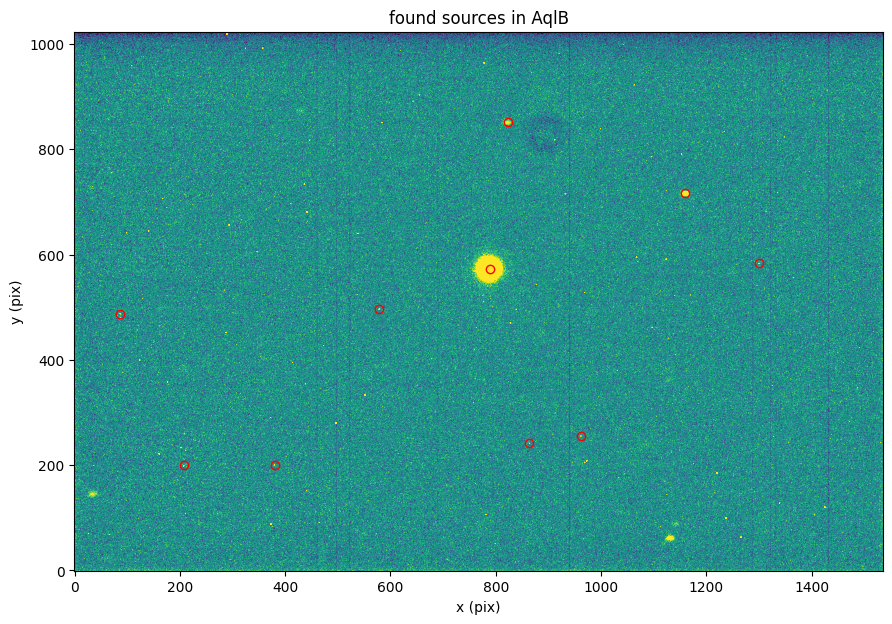

Found 2 stars in image AqlV


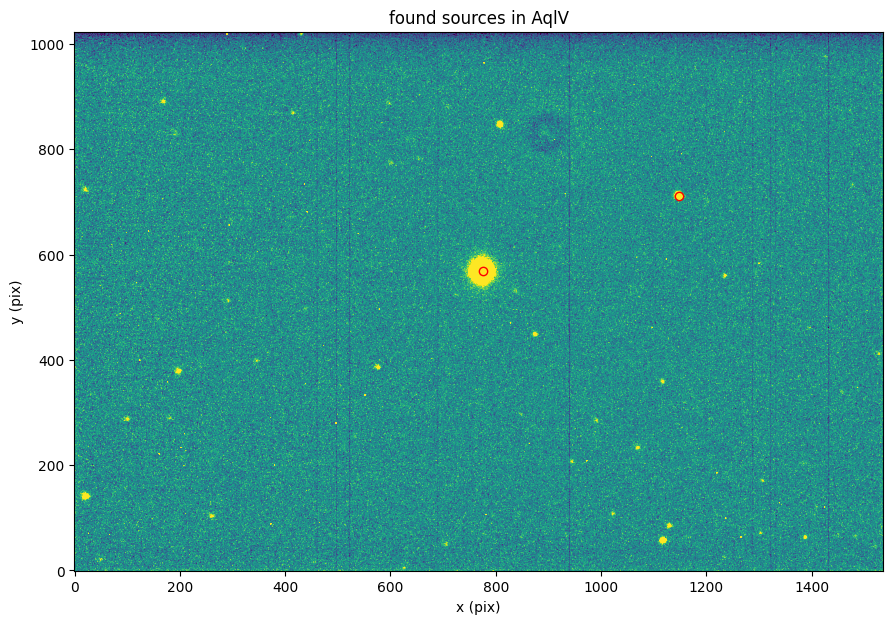

Found 2 stars in image AqlR


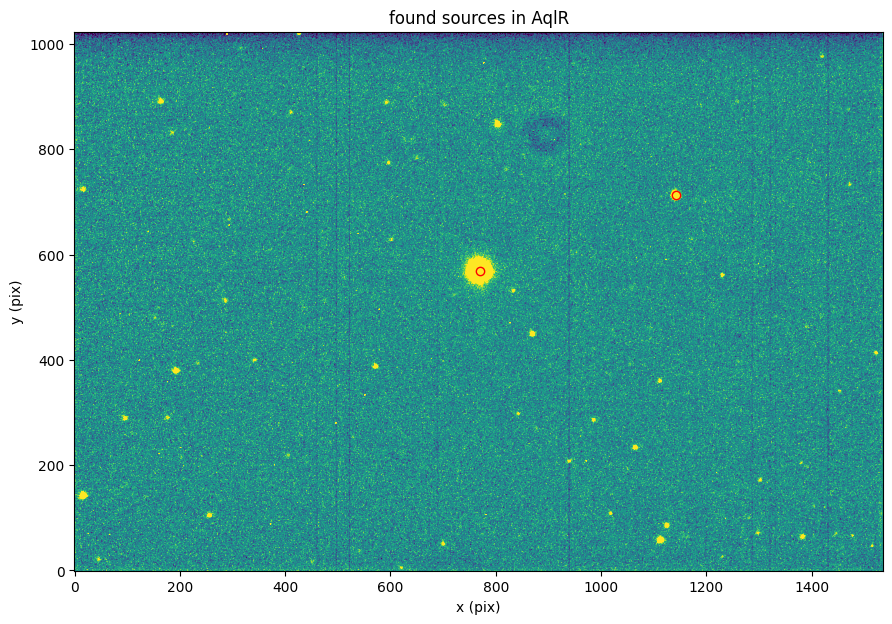

In [103]:
x_inits = {}
y_inits = {}

daofinds = {}

for key, image in data.items():

    mean, median, std = sigma_clipped_stats(image,sigma=3.0,maxiters=5)
    ## Find stars
    if key == 'AqlB':
        daofind = DAOStarFinder(fwhm=fwhms[key], threshold=5*std)  ##peakmax to exclude saturated stars!!
    elif key == 'AqlV':
        daofind = DAOStarFinder(fwhm=fwhms[key], threshold=130*std)  ##peakmax to exclude saturated stars!!
    elif key == 'AqlR':
        daofind = DAOStarFinder(fwhm=fwhms[key], threshold=250*std)  ##peakmax to exclude saturated stars!!

    sources = daofind(image - median)
    print(f"Found {len(sources)} stars in image {key}")

    daofinds[key]=daofind

    #Plot stars found
    fig = plt.figure(figsize=(12,7))
    l1 = np.percentile(image[np.isfinite(image)].flatten(), 1)
    l2 = np.percentile(image[np.isfinite(image)].flatten(), 99)
    plt.imshow(image,clim=(l1,l2),origin='lower')
    plt.plot(sources["xcentroid"],sources["ycentroid"],'or',mfc='none')
    plt.title(f"found sources in {key}")
    plt.xlabel("x (pix)")
    plt.ylabel("y (pix)")
    plt.show()

    ## Take nbright brightest stars and save
    nbright = 1
    brightest = np.argsort(sources['flux'])[::-1][0:nbright]
    brsources = sources[brightest]

    x_inits[key] = brsources['xcentroid']
    y_inits[key] = brsources['ycentroid']



# Iterative PSF Photometry :)


In [91]:
fwhms

{'AqlB': 9.226032384414031,
 'AqlV': 6.895457644963386,
 'AqlR': 6.089617449950836}

In [76]:
x_inits[key].value[0]

770.8571705845363

In [104]:
phots = {}

for key, image in data.items():

    group = SourceGrouper(fwhms[key])
    PSF = PSFPhotometry(
        grouper=group ,     
        psf_model=IntegratedGaussianPRF(sigma=fwhms[key]/gaussian_sigma_to_fwhm),
        finder=daofinds[key],
        fit_shape=(3,3), #play with this, this may be small
        aperture_radius=5 ,#play with this as well
        fitter_maxiters=500
    )
    init_params = QTable()
    init_params['x'] = x_inits[key]
    init_params['y'] = y_inits[key]

    phots[key] = PSF(image, 
                        #init_params = init_params,
                        error=np.sqrt(np.square(bkg_uncs[key])+np.square(error[key])), 
                )

In [101]:
phots['AqlB']

id,group_id,local_bkg,x_init,y_init,flux_init,x_fit,y_fit,flux_fit,x_err,y_err,flux_err,npixfit,group_size,qfit,cfit,flags
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,float64,float64,int64
1,1,0.0,208.39895610493448,199.55721587580643,115.58863873408514,210.50442729416707,188.02623793328064,120728.71597931089,nan,nan,nan,9,1,0.00015274189411481248,-1.246312852829323e-05,8
2,2,0.0,379.9079062116537,200.89022331347508,165.6262742390299,381.1775911675497,201.3320148967289,1879.0202205104183,1.910543220424672,1.7979907523924699,326.9584389022251,9,1,0.024542806395935687,0.011426060370706998,0
3,3,0.0,863.9343665568466,242.23109170676574,108.64923676421422,867.5024395495309,242.02931516229026,1577.9690715450242,3.621375782432401,3.9004345825848796,1255.4320131239351,9,1,0.012458888410030029,0.006273686170996934,0
4,4,0.0,962.1722557566507,255.81305231226887,68.77921697503052,961.7146001205128,254.48869104365116,763.8045766824164,4.273234057646121,4.637554937628143,401.31452143612125,9,1,0.026869992868146817,0.01214267703088477,0
5,5,0.0,86.91060250831501,487.7528688944939,102.08878576962907,86.8195853626869,488.7024574185356,851.6191012807772,4.287269279083125,4.068430315430259,244.74028365252164,9,1,0.02516295331852506,0.012883863533234853,0
6,6,0.0,579.0707830153344,497.0780288787225,166.55292960871435,580.0232663772775,492.8508364994992,1080.8416777542636,7.369804376356077,6.419475783682282,1901.61650401467,9,1,0.015417290226962352,0.00966338496666443,0
7,7,0.0,788.9872578604565,572.7586600074912,812027.1867543136,792.2300282115962,573.1176514154179,2039549.2085771896,2.7349425383744785,2.4605022551833757,1034273.2286670499,9,1,9.014283645771891e-08,7.88707576846783e-09,0
8,8,0.0,1300.1368925723166,584.0137600101174,192.24707374531775,1301.3077474486652,582.3987285608955,403.74668000561417,7.598045975212492,7.444537644030462,411.68837010858425,9,1,0.045849277651384975,0.02810160953873576,0
9,9,0.0,1159.9929182608626,716.5465363894791,857.5335436637869,1158.5704040792657,716.0102229381715,1491.356705181245,3.4744067956408338,3.2516126153691833,610.8533734741353,9,1,0.002229651531064421,3.1272289446261936e-05,0


In [105]:
phots['AqlV']

id,group_id,local_bkg,x_init,y_init,flux_init,x_fit,y_fit,flux_fit,x_err,y_err,flux_err,npixfit,group_size,qfit,cfit,flags
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,float64,float64,int64
1,1,0.0,775.487064522449,568.3103721640679,1420567.345847135,775.8634427465732,568.3044955250452,2084746.0508393315,0.19781868399695313,0.20620735472755122,48109.76258250533,9,1,8.741100459394934e-07,2.1737266322625178e-07,0
2,2,0.0,1147.7159113457749,712.1279188866462,6110.466950051126,1147.9530853252218,711.9846818488577,10137.14475942562,0.2706046945437301,0.284071344981085,276.8084858677153,9,1,0.00022563728497348954,6.991383368375501e-05,0


In [106]:
B = phots['AqlB'].to_pandas()
V = phots['AqlV'].to_pandas()
R = phots['AqlR'].to_pandas()

B = B.loc[B['flux_fit'].idxmax()]
V = V.loc[V['flux_fit'].idxmax()]
R = R.loc[R['flux_fit'].idxmax()]

In [107]:
inc = 20
if abs(B['x_fit']-V['x_fit'])>inc or abs(B['y_fit']-V['y_fit'])>inc:
    print("Something's wrong")

In [ ]:
V_dt = 3 #s
B_dt = 5 #s
R_dt = 2 #s

print(f"B flux/s = {B['flux_fit']/B_dt} +/- {B['flux_err']/B_dt}")
print(f"V flux/s = {V['flux_fit']/V_dt} +/- {V['flux_err']/V_dt}")
print(f"R flux/s = {R['flux_fit']/R_dt} +/- {R['flux_err']/R_dt}")


B flux/s = 407909.84171543794 +/- 206854.64573340997
V flux/s = 62373418808.408424 +/- nan
R flux/s = 18774636.474678867 +/- nan
